In [1]:
cd ../../LATAQ

/home/icb/amirali.moinfar/projects/LATAQ


In [2]:
import os
import pathlib
import pickle

import anndata
import torch
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.models import EMBEDCVAE
from lataq.exp_dict import EXPERIMENT_INFO

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=500)
plt.rcParams['figure.figsize'] = (5, 5)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

%load_ext autoreload
%autoreload 2

In [3]:
home_dir = os.path.expanduser("~")

In [4]:
# Copies from: "/storage/groups/ml01/workspace/carlo.dedonno/lataq_reproduce/notebooks/hlca_core_new/"
HLCA_TRAINED_MODEL = os.path.join(home_dir, "io/lataq_repr/lataq_models/hlca_core_sample/")

EXTENDED_MODELS = os.path.join(home_dir, "io/lataq_repr/lataq_models/hlca_extended/")

# TRAIN_DATA = os.path.join(home_dir, "data/HLCA/hlca_counts.h5ad")
# Copied from "/storage/groups/ml01/workspace/carlo.dedonno/lataq_reproduce/data/hlca_counts_commonvars.h5ad"
TRAIN_DATA = os.path.join(home_dir, "io/lataq_repr/lataq_models/hlca_counts_commonvars.h5ad")
SCARCHES_TRAIN_DATA = os.path.join(home_dir, "data/HLCA/HLCA_v1_scANVI_input.h5ad")
QUERY_DATA = os.path.join(home_dir, "data/HLCA/extension_data_pooled_raw_2000genes.h5ad")
QUERY_DATA = (
    '/storage/groups/ml01/workspace/'
    'hlca_lisa.sikkema_malte.luecken/'
    'HLCA_reproducibility/data/HLCA_extended/'
    'extension_datasets/raw/Meyer/Meyer_2021_raw.h5ad'
)
HLCA_LABEL_RELATIONS = os.path.join(home_dir, "repositories/HLCA_reproducibility/supporting_files/metadata_harmonization/HLCA_cell_type_reference_mapping_20211103.csv")

In [5]:
# TODO: Shouldn;t we use something else?
condition_key = 'sample'
cell_type_key = ['ann_finest_level']

surgery_epochs = 500
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [6]:
PARAMS = {
    'EPOCHS': 50,                                      #TOTAL TRAINING EPOCHS
    'N_PRE_EPOCHS': 40,                                #EPOCHS OF PRETRAINING WITHOUT LANDMARK LOSS
    #'DATA_DIR': '../../lataq_reproduce/data',          #DIRECTORY WHERE THE DATA IS STORED
    #'DATA': 'pancreas',                                #DATA USED FOR THE EXPERIMENT
    'EARLY_STOPPING_KWARGS': {                         #KWARGS FOR EARLY STOPPING
        "early_stopping_metric": "val_landmark_loss",  ####value used for early stopping
        "mode": "min",                                 ####choose if look for min or max
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    'LABELED_LOSS_METRIC': 'dist',           
    'UNLABELED_LOSS_METRIC': 'dist',
    'LATENT_DIM': 25,
    'ALPHA_EPOCH_ANNEAL': 1e3,
    'CLUSTERING_RES': 2,
    'HIDDEN_LAYERS': 3,
    'ETA': 5,
}

## Helper functions

In [7]:
# Inspired by https://github.com/LungCellAtlas/mapping_data_to_the_HLCA/blob/main/scripts/data_import_and_cleaning.py
def format_query_respect_to_reference(ref_anndata, query_anndata, ref_col='index', query_col='index'):
    if ref_col == 'index':
            ref_genes = ref_anndata.var.index.values
    else:
        ref_genes = ref_anndata.var[ref_col].astype('str').values
    if query_col != 'index':
        query_anndata = query_anndata[:, query_anndata.var[query_col].isin(ref_genes)].copy()
        query_anndata.var.set_index(query_col, inplace=True)
        query_anndata = query_anndata[:, ~query_anndata.var.index.duplicated(keep='first')]
    query_genes = query_anndata.var.index.values
    genes_to_add = set(ref_genes).difference(query_genes)
    diff = len(genes_to_add)
    if diff > 0:
        print(f'Not all genes were recovered, filling in zeros for {diff} missing genes...')
        # Genes to pad with
        df_padding = pd.DataFrame(data=np.zeros((query_anndata.shape[0], len(genes_to_add))), index=query_anndata.obs_names, columns=genes_to_add)
        adata_padding = sc.AnnData(df_padding, dtype=np.float32)
        # Concatenate object
        query_anndata = anndata.concat([query_anndata, adata_padding], axis=1, join='outer', index_unique=None, merge='unique')
    # subset and order:
    results_anndata = query_anndata[:, ref_genes].copy()
    results_anndata.var.index = ref_anndata.var.index.values
    return results_anndata

In [8]:
#!/bin/env python

import scanpy as sc
import pandas as pd


from collections import Counter

import numpy as np
from sklearn.neighbors import KNeighborsTransformer

def weighted_knn_trainer(train_adata, train_adata_emb, label_key, n_neighbors=50):
    """Trains a weighted KNN classifier on ``train_adata``.
    Parameters
    ----------
    train_adata: :class:`~anndata.AnnData`
        Annotated dataset to be used to train KNN classifier with ``label_key`` as the target variable.
    train_adata_emb: str
        Name of the obsm layer to be used for calculation of neighbors. If set to "X", anndata.X will be
        used
    label_key: str
        Name of the column to be used as target variable (e.g. cell_type) in ``train_adata`` and ``query_adata``.
    n_neighbors: int
        Number of nearest neighbors in KNN classifier.
    """
    print(
        f"Weighted KNN with n_neighbors = {n_neighbors} ... ",
        end="",
    )
    k_neighbors_transformer = KNeighborsTransformer(
        n_neighbors=n_neighbors,
        mode="distance",
        algorithm="brute",
        metric="euclidean",
        n_jobs=-1,
    )
    if train_adata_emb == "X":
        train_emb = train_adata.X
    elif train_adata_emb in train_adata.obsm.keys():
        train_emb = train_adata.obsm[train_adata_emb]
    else:
        raise ValueError(
            "train_adata_emb should be set to either 'X' or the name of the obsm layer to be used!"
        )
    k_neighbors_transformer.fit(train_emb)
    return k_neighbors_transformer


def weighted_knn_transfer(
    query_adata,
    query_adata_emb,
    ref_adata_obs,
    label_keys,
    knn_model,
    threshold=1,
    pred_unknown=False,
    mode="package",
):
    """Annotates ``query_adata`` cells with an input trained weighted KNN classifier.
    Parameters
    ----------
    query_adata: :class:`~anndata.AnnData`
        Annotated dataset to be used to queryate KNN classifier. Embedding to be used
    query_adata_emb: str
        Name of the obsm layer to be used for label transfer. If set to "X",
        query_adata.X will be used
    ref_adata_obs: :class:`pd.DataFrame`
        obs of ref Anndata
    label_keys: str
        Names of the columns to be used as target variables (e.g. cell_type) in ``query_adata``.
    knn_model: :class:`~sklearn.neighbors._graph.KNeighborsTransformer`
        knn model trained on reference adata with weighted_knn_trainer function
    threshold: float
        Threshold of uncertainty used to annotating cells as "Unknown". cells with
        uncertainties higher than this value will be annotated as "Unknown".
        Set to 1 to keep all predictions. This enables one to later on play
        with thresholds.
    pred_unknown: bool
        ``False`` by default. Whether to annotate any cell as "unknown" or not.
        If `False`, ``threshold`` will not be used and each cell will be annotated
        with the label which is the most common in its ``n_neighbors`` nearest cells.
    mode: str
        Has to be one of "paper" or "package". If mode is set to "package",
        uncertainties will be 1 - P(pred_label), otherwise it will be 1 - P(true_label).
    """
    if not type(knn_model) == KNeighborsTransformer:
        raise ValueError(
            "knn_model should be of type sklearn.neighbors._graph.KNeighborsTransformer!"
        )

    if query_adata_emb == "X":
        query_emb = query_adata.X
    elif query_adata_emb in query_adata.obsm.keys():
        query_emb = query_adata.obsm[query_adata_emb]
    else:
        raise ValueError(
            "query_adata_emb should be set to either 'X' or the name of the obsm layer to be used!"
        )
    top_k_distances, top_k_indices = k_neighbors_transformer.kneighbors(X=query_emb)

    stds = np.std(top_k_distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)

    top_k_distances_tilda = np.exp(-np.true_divide(top_k_distances, stds))

    weights = top_k_distances_tilda / np.sum(
        top_k_distances_tilda, axis=1, keepdims=True
    )
    cols = ref_adata_obs.columns[ref_adata_obs.columns.str.startswith(label_keys)]
    uncertainties = pd.DataFrame(columns=cols, index=query_adata.obs_names)
    pred_labels = pd.DataFrame(columns=cols, index=query_adata.obs_names)
    for i in range(len(weights)):
        for j in cols:
            y_train_labels = ref_adata_obs[j].values
            unique_labels = np.unique(y_train_labels[top_k_indices[i]])
            best_label, best_prob = None, 0.0
            for candidate_label in unique_labels:
                candidate_prob = weights[
                    i, y_train_labels[top_k_indices[i]] == candidate_label
                ].sum()
                if best_prob < candidate_prob:
                    best_prob = candidate_prob
                    best_label = candidate_label

            if pred_unknown:
                if best_prob >= threshold:
                    pred_label = best_label
                else:
                    pred_label = "Unknown"
            else:
                pred_label = best_label

            if mode == "package":
                uncertainties.iloc[i][j] = (max(1 - best_prob, 0))

            else:
                raise Exception("Inquery Mode!")

            pred_labels.iloc[i][j] = (pred_label)

    print("finished!")

    return pred_labels, uncertainties

In [9]:
reference_adata = sc.read(TRAIN_DATA)
reference_adata

AnnData object with n_obs × n_vars = 584884 × 1897
    obs: 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'sample', 'study', 'subject_ID', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_

In [10]:
query_adata = sc.read(QUERY_DATA)
query_adata

AnnData object with n_obs × n_vars = 128628 × 33694
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'ann_level_1_clean', 'ann_level_2_clean', 'ann_level_3_clean', 'ann_level_4_clean', 'ann_level_5_clean', 'subject_ID', 'subject_ID_as_published', 'Processing_site', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'dataset'
    var: 'gene_sym

In [11]:
query_adata = format_query_respect_to_reference(reference_adata, query_adata, ref_col='index', query_col='gene_symbols')
query_adata

/home/icb/amirali.moinfar/miniconda3/envs/lataq/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 128628 × 1897
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'ann_level_1_clean', 'ann_level_2_clean', 'ann_level_3_clean', 'ann_level_4_clean', 'ann_level_5_clean', 'subject_ID', 'subject_ID_as_published', 'Processing_site', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'dataset'

In [12]:
lataq_model = EMBEDCVAE.load(
    HLCA_TRAINED_MODEL,
    reference_adata,
)
lataq_model.model.cuda()

AnnData object with n_obs × n_vars = 584884 × 1897
    obs: 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'sample', 'study', 'subject_ID', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_

EmbedCVAE(
  (embedding): Embedding(166, 20, max_norm=1)
  (encoder): Encoder(
    (FC): Sequential(
      (L0): CondLayers(
        (expr_L): Linear(in_features=1897, out_features=128, bias=True)
        (cond_L): Linear(in_features=20, out_features=128, bias=False)
      )
      (N0): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A0): ReLU()
      (D0): Dropout(p=0.05, inplace=False)
      (L1): Linear(in_features=128, out_features=128, bias=True)
      (N1): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A1): ReLU()
      (D1): Dropout(p=0.05, inplace=False)
      (L2): Linear(in_features=128, out_features=128, bias=True)
      (N2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A2): ReLU()
      (D2): Dropout(p=0.05, inplace=False)
    )
    (mean_encoder): Linear(in_features=128, out_features=50, bias=True)
    (log_var_encoder): Linear(in_features=128, out_features=50, bias=True)
  )
  (decoder): Decoder(
    (FirstL): Sequential(
  

In [13]:
data_latent = lataq_model.get_latent(
    reference_adata.X.A.astype('float32'),
    reference_adata.obs[condition_key].values,
    mean=True,
)
adata_latent = sc.AnnData(data_latent)
adata_latent.obs = reference_adata.obs.copy()

In [14]:
# Takes too long
# sc.pp.neighbors(adata_latent, n_neighbors=8)
# sc.tl.leiden(adata_latent)
# sc.tl.umap(adata_latent)
# sc.pl.umap(adata_latent,
#            color=['batch', 'cell_type'],
#            frameon=False,
#            wspace=0.6,)

### Transfer model to CPU

In [15]:
# TODO
# lataq_model.model.cpu()
# lataq_model.save(HLCA_TRAINED_MODEL + '.cpu')
# lataq_model = EMBEDCVAE.load(
#     HLCA_TRAINED_MODEL + '.cpu',
#     reference_adata,
# )

In [16]:
# lataq_model.get_latent(
#     reference_adata.X.A.astype('float32'), 
#     reference_adata.obs[condition_key].values,
#     mean=True,
# )

## Perform surgery on reference model and train on query dataset

In [17]:
study = "Meyer_2021"
ref_path = HLCA_TRAINED_MODEL

In [22]:
query_subadata = query_adata[query_adata.obs.study == study,:].copy()
query_subadata.obs[cell_type_key] = 'NA'
print(query_subadata.shape)

(128628, 1897)


In [23]:
query_subadata

AnnData object with n_obs × n_vars = 128628 × 1897
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'ann_level_1_clean', 'ann_level_2_clean', 'ann_level_3_clean', 'ann_level_4_clean', 'ann_level_5_clean', 'subject_ID', 'subject_ID_as_published', 'Processing_site', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'dataset', 'ann_finest_level'

In [24]:
# query_subadata.obs['ann_finest_level'] = [
#         query_subadata.obs.loc[cell, f"original_ann_level_{highest_lev}"]
#         for cell, highest_lev in zip(
#             query_subadata.obs.index, query_subadata.obs.original_ann_highest_res
#         )
# ]

In [25]:
# load model and set relevant variables:
# model = EMBEDCVAE.load_query_data(
#     adata=query_subadata,
#     labeled_indices=[],
#     reference_model=ref_path
# )
# model.model.cuda()
# model.train(
#     n_epochs=surgery_epochs,
#     alpha_epoch_anneal=200,
#     early_stopping_kwargs=early_stopping_kwargs,
#     weight_decay=0
# )
# surgery_path = os.path.join(EXTENDED_MODELS, condition)
# pathlib.Path(surgery_path).mkdir(parents=True, exist_ok=True)
# model.save(surgery_path, overwrite=True)

In [26]:
%%time

model = EMBEDCVAE.load_query_data(
    adata=query_subadata,
    labeled_indices=[],
    reference_model=ref_path
)

model.train(
    n_epochs=100,
    pretraining_epochs=80,
    early_stopping_kwargs=PARAMS['EARLY_STOPPING_KWARGS'],
    alpha_epoch_anneal=PARAMS['ALPHA_EPOCH_ANNEAL'],
    eta=0,
    clustering_res=PARAMS['CLUSTERING_RES'],
    labeled_loss_metric=PARAMS['LABELED_LOSS_METRIC'],
    unlabeled_loss_metric=PARAMS['UNLABELED_LOSS_METRIC'],
    weight_decay=0,
    use_stratified_sampling=False,
    reload_best=False,
)

AnnData object with n_obs × n_vars = 128628 × 1897
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'ann_level_1_clean', 'ann_level_2_clean', 'ann_level_3_clean', 'ann_level_4_clean', 'ann_level_5_clean', 'subject_ID', 'subject_ID_as_published', 'Processing_site', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'dataset', 'ann_finest_level'

### Transfer model to CPU

In [27]:
# TODO

In [28]:
# model = EMBEDCVAE.load(
#     os.path.join(EXTENDED_MODELS, condition),
#     query_subadata,
# )
# model.model.cuda()
# # TODO: landmarks dict should use torch.nn.ParameterDict
# model.model.landmarks_labeled['mean'] = model.model.landmarks_labeled['mean'].cuda()
# model.model.landmarks_labeled['cov'] = model.model.landmarks_labeled['cov'].cuda()
latent_subdata = model.get_latent(
    query_subadata.X.A, 
    query_subadata.obs[condition_key]
)
latent_subadata = sc.AnnData(latent_subdata)
latent_subadata.obs = query_subadata.obs.copy()

subdata_predictions = model.classify(
    x=query_subadata.X.A,
    c=query_subadata.obs[condition_key],
    metric='dist',
    get_prob=False,
    threshold=-np.inf
)

In [29]:
filename = os.path.expanduser(f"~/tmp/lataq_{condition_key}_subdata_predictions/{study}")

In [30]:
pathlib.Path(filename).parent.mkdir(parents=True, exist_ok=True)
with open(filename, 'wb') as f:
    pickle.dump([subdata_predictions, latent_subadata], f)
subdata_predictions

{'ann_finest_level': {'preds': array(['Interstitial Mφ perivascular', 'Adventitial fibroblasts',
         'Lymphatic EC differentiating', 'Adventitial fibroblasts',
         'Adventitial fibroblasts', 'Lymphatic EC mature',
         'Lymphatic EC differentiating', ..., 'B cells', 'CD4 T cells',
         'CD4 T cells', 'Mast cells', 'NK cells', 'CD8 T cells',
         'CD4 T cells'], dtype='<U28'),
  'probs': array([0.27, 0.08, 0.12, 0.08, 0.07, 0.07, 0.08, ..., 0.1 , 0.11, 0.14,
         0.14, 0.08, 0.08, 0.19], dtype=float32),
  'weighted_distances': array([[ 2.61, 15.  , 17.76,  3.53, 10.45, 11.28, 14.44, ..., 14.87,
          18.45, 14.52, 11.66, 19.6 , 23.5 ,  2.65],
         [18.54, 23.43, 20.18, 19.14, 15.85, 14.7 , 14.17, ..., 18.91,
          19.22, 33.29, 21.65,  0.29, 16.83, 25.87],
         [22.09, 25.05, 22.86, 23.6 , 14.16, 14.65, 13.45, ..., 26.1 ,
          12.16, 36.95, 26.94, 17.27,  0.27, 31.17],
         [18.66, 23.47, 20.8 , 19.22, 16.17, 15.12, 13.72, ..., 19.46,
 

In [31]:
with open(filename, 'rb') as f:
    subdata_predictions, latent_subadata = pickle.load(f)
subdata_predictions

{'ann_finest_level': {'preds': array(['Interstitial Mφ perivascular', 'Adventitial fibroblasts',
         'Lymphatic EC differentiating', 'Adventitial fibroblasts',
         'Adventitial fibroblasts', 'Lymphatic EC mature',
         'Lymphatic EC differentiating', ..., 'B cells', 'CD4 T cells',
         'CD4 T cells', 'Mast cells', 'NK cells', 'CD8 T cells',
         'CD4 T cells'], dtype='<U28'),
  'probs': array([0.27, 0.08, 0.12, 0.08, 0.07, 0.07, 0.08, ..., 0.1 , 0.11, 0.14,
         0.14, 0.08, 0.08, 0.19], dtype=float32),
  'weighted_distances': array([[ 2.61, 15.  , 17.76,  3.53, 10.45, 11.28, 14.44, ..., 14.87,
          18.45, 14.52, 11.66, 19.6 , 23.5 ,  2.65],
         [18.54, 23.43, 20.18, 19.14, 15.85, 14.7 , 14.17, ..., 18.91,
          19.22, 33.29, 21.65,  0.29, 16.83, 25.87],
         [22.09, 25.05, 22.86, 23.6 , 14.16, 14.65, 13.45, ..., 26.1 ,
          12.16, 36.95, 26.94, 17.27,  0.27, 31.17],
         [18.66, 23.47, 20.8 , 19.22, 16.17, 15.12, 13.72, ..., 19.46,
 

In [32]:
label_transfer_df = pd.DataFrame({
    'original_pred': subdata_predictions['ann_finest_level']['preds'],
    'prob': np.log1p(subdata_predictions['ann_finest_level']['probs']),
    'manual_ann': query_subadata.obs['original_celltype_ann'].values
})
label_transfer_df

,original_pred,prob,manual_ann
0,Interstitial Mφ perivascular,0.235383,Macro_int
1,Adventitial fibroblasts,0.075392,Fibro_adventitial
2,Lymphatic EC differentiating,0.109095,Endothelia_Lymphatic
3,Adventitial fibroblasts,0.075410,Fibro_adventitial
4,Adventitial fibroblasts,0.069759,Fibro_adventitial
...,...,...,...
128623,CD4 T cells,0.134642,CD4
128624,Mast cells,0.126978,Mast_cell
128625,NK cells,0.073454,NK
128626,CD8 T cells,0.075147,gdT


In [33]:
UNCERTAINTY_THRESHOLD = 0.5
label_transfer_df['pred'] = np.where(
    label_transfer_df['prob'] <= UNCERTAINTY_THRESHOLD,
    label_transfer_df['original_pred'].copy(),
    'Unknown'
)
label_transfer_df

,original_pred,prob,manual_ann,pred
0,Interstitial Mφ perivascular,0.235383,Macro_int,Interstitial Mφ perivascular
1,Adventitial fibroblasts,0.075392,Fibro_adventitial,Adventitial fibroblasts
2,Lymphatic EC differentiating,0.109095,Endothelia_Lymphatic,Lymphatic EC differentiating
3,Adventitial fibroblasts,0.075410,Fibro_adventitial,Adventitial fibroblasts
4,Adventitial fibroblasts,0.069759,Fibro_adventitial,Adventitial fibroblasts
...,...,...,...,...
128623,CD4 T cells,0.134642,CD4,CD4 T cells
128624,Mast cells,0.126978,Mast_cell,Mast cells
128625,NK cells,0.073454,NK,NK cells
128626,CD8 T cells,0.075147,gdT,CD8 T cells


In [36]:
def get_celltype_mappings(dataset_name, csv_file_path=HLCA_LABEL_RELATIONS):
    LEVELS = ['Level_1', 'Level_2', 'Level_3', 'Level_4', 'Level_5']
    main_mapping = pd.read_csv(csv_file_path, skiprows=1)
    main_mapping = main_mapping.replace(">", np.nan)
    main_mapping["ann_finest_level"] = main_mapping[LEVELS[-1]]
    for level in LEVELS[::-1]:
        main_mapping["ann_finest_level"] = main_mapping["ann_finest_level"].combine_first(main_mapping[level])
    main_mapping = main_mapping.fillna('-')
    main_mapping = main_mapping.replace("|", np.nan)
    for level in LEVELS:
        main_mapping[level] = main_mapping[level].ffill()
    main_mapping = main_mapping.replace("-", np.nan)
    final_mapping = main_mapping[[dataset_name, 'ann_finest_level']].dropna(subset=[dataset_name])
    return final_mapping

In [37]:
mapping_df = get_celltype_mappings('Meyer_2021')
mapping_df

,Meyer_2021,ann_finest_level
2,Basal,Basal
6,Suprabasal,Suprabasal
8,Dividing_Basal,Basal proliferating
16,Deuterosomal,Deuterosomal
19,Ciliated,Multiciliated
...,...,...
257,Mast_cell,Mast cells
264,Megakaryocyte,Megakaryocytes
265,Erythrocyte,Erythrocytes
269,Schwann_nonmyelinating,Schwann nonmyelinating


In [38]:
mapping_df.to_csv(os.path.expanduser('~/tmp/mapping_df.csv'))

In [39]:
# Rename Meyer annotations
label_transfer_df = (
    label_transfer_df
    .merge(mapping_df.rename({'Meyer_2021': 'manual_ann'}, axis=1), 
           on='manual_ann', 
           how='left')
    .drop(columns='manual_ann')
    .rename({'ann_finest_level': 'manual_ann'}, axis=1)
)
label_transfer_df

,original_pred,prob,pred,manual_ann
0,Interstitial Mφ perivascular,0.235383,Interstitial Mφ perivascular,Interstitial macrophages
1,Adventitial fibroblasts,0.075392,Adventitial fibroblasts,Fibroblasts
2,Lymphatic EC differentiating,0.109095,Lymphatic EC differentiating,Lymphatic EC
3,Adventitial fibroblasts,0.075410,Adventitial fibroblasts,Fibroblasts
4,Adventitial fibroblasts,0.069759,Adventitial fibroblasts,Fibroblasts
...,...,...,...,...
128623,CD4 T cells,0.134642,CD4 T cells,CD4 T cells
128624,Mast cells,0.126978,Mast cells,Mast cells
128625,NK cells,0.073454,NK cells,NK cells
128626,CD8 T cells,0.075147,CD8 T cells,Gamma-delta T cells


In [12]:
# Note: Got from HLCA notebbok reuslts

manual_to_fine_grained = {'NK cells': ['NK cells'],
 'Neuroendocrine': ['Neuroendocrine'],
 'CD8 T cells': ['CD8 T cells'],
 'Suprabasal': ['Suprabasal'],
 'Alveolar fibroblasts': ['Alveolar fibroblasts'],
 'Plasma cells': ['Plasma cells'],
 'Mast cells': ['Mast cells'],
 'Alveolar macrophages': ['Alveolar macrophages'],
 'SMG mucous': ['SMG mucous'],
 'AT1': ['AT1'],
 'Classical monocytes': ['Classical monocytes'],
 'Mesothelium': ['Mesothelium'],
 'DC2': ['DC2'],
 'Non-classical monocytes': ['Non-classical monocytes'],
 'DC1': ['DC1'],
 'Deuterosomal': ['Deuterosomal'],
 'AT2 proliferating': ['AT2 proliferating'],
 'Pericytes': ['Pericytes'],
 'EC venous pulmonary': ['EC venous pulmonary'],
 'AT2': ['AT2'],
 'EC venous systemic': ['EC venous systemic'],
 'Plasmacytoid DCs': ['Plasmacytoid DCs'],
 'CD4 T cells': ['CD4 T cells'],
 'SMG serous': ['SMG serous (nasal)', 'SMG serous (bronchial)'],
 'Secretory': ['Club (non-nasal)',
  'Club (nasal)',
  'Goblet (nasal)',
  'Goblet (bronchial)',
  'Goblet (subsegmental)',
  'Transitional Club-AT2'],
 'Basal': ['Basal resting', 'Suprabasal'],
 'Lymphatic EC': ['Lymphatic EC mature',
  'Lymphatic EC proliferating',
  'Lymphatic EC differentiating'],
 'Goblet': ['Goblet (nasal)', 'Goblet (bronchial)', 'Goblet (subsegmental)'],
 'Fibroblasts': ['Peribronchial fibroblasts',
  'Adventitial fibroblasts',
  'Alveolar fibroblasts',
  'Pericytes',
  'Subpleural fibroblasts'],
 'Club': ['Club (non-nasal)', 'Club (nasal)'],
 'Rare': ['Ionocyte', 'Tuft', 'Neuroendocrine'],
 'Interstitial macrophages': ['Monocyte-derived Mφ',
  'Interstitial Mφ perivascular'],
 'Multiciliated': ['Multiciliated (nasal)', 'Multiciliated (non-nasal)'],
 'EC capillary': ['EC aerocyte capillary', 'EC general capillary'],
 'Mature B cells': ['B cells'],
 'NK_ITGAD+': ['NK cells'],
 'CD4T cells TRM': ['CD4 T cells'],
 'Arterial Pulmonary': ['EC arterial'],
 'Arterial Systemic': ['EC arterial'],
 'CD4 T cells MAIT': ['CD4 T cells'],
 'CD8 T cells TRM': ['CD8 T cells'],
 'CD4 T cells naive': ['CD4 T cells'],
 'Airway smooth muscle': ['Smooth muscle'],
 'NK_XCL1+': ['NK cells'],
 'CD8 T cells GZMK+': ['CD8 T cells'],
 'Plasmablasts': ['Plasma cells'],
 'Vascular smooth muscle': ['Smooth muscle'],
 'Naive B cells': ['B cells'],
 'CD8 T cells ME': ['CD8 T cells'],
 'Erythrocytes': ['New'],
 'Basal proliferating': ['Basal resting', 'Suprabasal'],
 'Schwann myelinating': ['New'],
 'Gamma-delta T cells': ['New'],
 'DC activated': ['Migratory DCs'],
 'Megakaryocytes': ['New'],
 'NKT cells': ['New'],
 'Chondrocytes': ['New'],
 'Regulatory T cells': ['New'],
 'ILCs': ['New'],
 'Mφ proliferating': ['Alveolar Mφ proliferating',
  'Interstitial Mφ perivascular',
  'Monocyte-derived Mφ',
  'Alveolar macrophages'],
 'Schwann nonmyelinating': ['New']}

# Note: for compatibility with Carlo
manual_to_fine_grained['Club'] += 'Transitional Club-AT2'
# My division
manual_to_fine_grained['EC aerocyte capillary'] =  ['EC aerocyte capillary']
manual_to_fine_grained['EC general capillary'] =  ['EC general capillary']


manual_to_fig_label = {'NK cells': 'NK cells',
 'Neuroendocrine': 'Neuroendocrine',
 'CD8 T cells': 'CD8 T cells',
 'Suprabasal': 'Suprabasal',
 'Alveolar fibroblasts': 'Alveolar fibroblasts',
 'Plasma cells': 'Plasma cells',
 'Mast cells': 'Mast cells',
 'Alveolar macrophages': 'Alveolar macrophages',
 'SMG mucous': 'SMG mucous',
 'AT1': 'AT1',
 'Classical monocytes': 'Classical monocytes',
 'Mesothelium': 'Mesothelium',
 'DC2': 'DC2',
 'Non-classical monocytes': 'Non-classical monocytes',
 'DC1': 'DC1',
 'Deuterosomal': 'Deuterosomal',
 'AT2 proliferating': 'AT2 proliferating',
 'Pericytes': 'Pericytes',
 'EC venous pulmonary': 'EC venous pulmonary',
 'AT2': 'AT2',
 'EC venous systemic': 'EC venous systemic',
 'Plasmacytoid DCs': 'Plasmacytoid DCs',
 'CD4 T cells': 'CD4 T cells',
 'Mature B cells': 'B cells',
 'NK_ITGAD+': 'NK cells',
 'CD4T cells TRM': 'CD4 T cells',
 'Arterial Pulmonary': 'EC arterial',
 'Arterial Systemic': 'EC arterial',
 'CD4 T cells MAIT': 'CD4 T cells',
 'CD8 T cells TRM': 'CD8 T cells',
 'CD4 T cells naive': 'CD4 T cells',
 'Airway smooth muscle': 'Smooth muscle',
 'NK_XCL1+': 'NK cells',
 'CD8 T cells GZMK+': 'CD8 T cells',
 'Plasmablasts': 'Plasma cells',
 'Vascular smooth muscle': 'Smooth muscle',
 'Naive B cells': 'B cells',
 'CD8 T cells ME': 'CD8 T cells',
 'Basal proliferating': 'Basal',
 'Mφ proliferating': 'Macrophages',
 'SMG serous': 'SMG serous',
 'Secretory': 'Secretory',
 'Basal': 'Basal',
 'Lymphatic EC': 'Lymphatic EC',
 'Goblet': 'Goblet',
 'Fibroblasts': 'Fibroblasts',
 'Club': 'Club',
 'Rare': 'Rare',
 'Interstitial macrophages': 'Interstitial macrophages',
 'Multiciliated': 'Multiciliated',
 'EC aerocyte capillary': 'EC aerocyte capillary',
 'EC general capillary': 'EC general capillary',
 'Erythrocytes': 'Erythrocytes',
 'Schwann myelinating': 'Schwann myelinating',
 'Gamma-delta T cells': 'Gamma-delta T cells',
 'DC activated': 'Migratory DCs',
 'Megakaryocytes': 'Megakaryocytes',
 'NKT cells': 'NKT cells',
 'Chondrocytes': 'Chondrocytes',
 'Regulatory T cells': 'Regulatory T cells',
 'ILCs': 'ILCs',
 'Schwann nonmyelinating': 'Schwann nonmyelinating'}

ct_ordered_q = ['Basal',
 'Suprabasal',
 'Deuterosomal',
 'Multiciliated',
 'Club',
 'Secretory',
 'Goblet',
 'Rare',
 'Neuroendocrine',
 'SMG serous',
 'SMG mucous',
 'AT1',
 'AT2',
 'AT2 proliferating',
 'EC arterial',
 'EC aerocyte capillary',
 'EC general capillary',
 'EC venous systemic',
 'EC venous pulmonary',
 'Lymphatic EC',
 'Fibroblasts',
 'Alveolar fibroblasts',
 'Pericytes',
 'Smooth muscle',
 'Mesothelium',
 'B cells',
 'Plasma cells',
 'CD4 T cells',
 'CD8 T cells',
 'NK cells',
 'DC1',
 'DC2',
 'Migratory DCs',
 'Plasmacytoid DCs',
 'Alveolar macrophages',
 'Macrophages',
 'Interstitial macrophages',
 'Classical monocytes',
 'Non-classical monocytes',
 'Mast cells',
 'Chondrocytes',
 'Erythrocytes',
 'Gamma-delta T cells',
 'ILCs',
 'Megakaryocytes',
 'NKT cells',
 'Regulatory T cells',
 'Schwann myelinating',
 'Schwann nonmyelinating']

In [13]:
acceptable_predictions_df = pd.DataFrame([(k, v) for k, vl in manual_to_fine_grained.items() for v in vl], columns=['manual_ann', 'pred'])
acceptable_predictions_df

,manual_ann,pred
0,NK cells,NK cells
1,Neuroendocrine,Neuroendocrine
2,CD8 T cells,CD8 T cells
3,Suprabasal,Suprabasal
4,Alveolar fibroblasts,Alveolar fibroblasts
...,...,...
104,Mφ proliferating,Monocyte-derived Mφ
105,Mφ proliferating,Alveolar macrophages
106,Schwann nonmyelinating,New
107,EC aerocyte capillary,EC aerocyte capillary


In [42]:
acceptable_predictions_df.to_csv(os.path.expanduser(f'~/tmp/hlca_{condition_key}acceptable_predictions_df.csv'))

In [43]:
label_transfer_df = label_transfer_df.merge(acceptable_predictions_df.assign(status='Correct'), how='left').fillna({'status': 'Incorrect'})
label_transfer_df['status'] = np.where(label_transfer_df['pred'] == 'Unknown', 'Unknown', label_transfer_df['status'])
label_transfer_df

,original_pred,prob,pred,manual_ann,status
0,Interstitial Mφ perivascular,0.235383,Interstitial Mφ perivascular,Interstitial macrophages,Correct
1,Adventitial fibroblasts,0.075392,Adventitial fibroblasts,Fibroblasts,Correct
2,Lymphatic EC differentiating,0.109095,Lymphatic EC differentiating,Lymphatic EC,Correct
3,Adventitial fibroblasts,0.075410,Adventitial fibroblasts,Fibroblasts,Correct
4,Adventitial fibroblasts,0.069759,Adventitial fibroblasts,Fibroblasts,Correct
...,...,...,...,...,...
128623,CD4 T cells,0.134642,CD4 T cells,CD4 T cells,Correct
128624,Mast cells,0.126978,Mast cells,Mast cells,Correct
128625,NK cells,0.073454,NK cells,NK cells,Correct
128626,CD8 T cells,0.075147,CD8 T cells,Gamma-delta T cells,Incorrect


In [44]:
label_transfer_df.to_csv(os.path.expanduser(f"~/tmp/hlca_{condition_key}lataq_dist_uncert_results.csv"))

In [45]:
label_transfer_df['manual_ann_fig'] = label_transfer_df.manual_ann.map(manual_to_fig_label)

In [46]:
total_n_per_ct = label_transfer_df.manual_ann_fig.value_counts()
total_n_per_ct["Overall"] = label_transfer_df.shape[0]

perc_correct = (pd.crosstab(
    label_transfer_df.manual_ann_fig, label_transfer_df.status
)
#                 .loc[sorted(set(label_transfer_df.manual_ann.values)), :]
                .loc[ct_ordered_q, :]
               )
perc_correct.loc["Overall", :] = (
    label_transfer_df.status.value_counts() / total_n_per_ct["Overall"] * 100
)
perc_correct = perc_correct.div(perc_correct.sum(axis=1), axis="rows") * 100



with plt.rc_context(
    {
        "figure.figsize": (0.4 * len(perc_correct), 3),
        "axes.spines.right": False,
        "axes.spines.top": False,
    }
):
    fig, ax = plt.subplots()
    perc_correct.plot(kind="bar", stacked=True, ax=ax)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], loc=(1.01, 0.60), frameon=False)

#     cts_no_underscore = [ct.replace("_", " ") for ct in cts_ordered_custom]
#     if incl_celln_in_label:
#         plt.xticks(
#             ticks=range(len(cts_ordered_q) + 1),
#             labels=[
#                 f"{ct_no_und} ({total_n_per_ct[ct]})"
#                 for ct_no_und, ct in zip(
#                     cts_no_underscore + ["Overall"], cts_ordered_custom #cts_ordered_q + ["Overall"]
#                 )
#             ],
#         )
#         plt.xlabel("Original label (n cells)")
#     else:
#         plt.xticks(
#             ticks=range(len(cts_ordered_custom)),
#             labels=[f"{ct_no_und}" for ct_no_und in cts_no_underscore],
#         )
#         plt.xlabel("Original label")
    ax.set_ylabel("% of cells")
    plt.grid(False)

In [47]:
latent_subadata = sc.AnnData(latent_subdata)
latent_subadata.obs = query_subadata.obs.copy()

In [14]:
cts_ordered = pd.read_csv(
    os.path.join(home_dir, "repositories/HLCA_reproducibility/supporting_files/celltype_structure_and_colors/manual_anns_and_leveled_anns_ordered.csv"), index_col=0
)
cts_ordered

,Level_1,Level_2,Level_3,Level_4,Level_5,ordering,colors
Basal resting,Epithelial,Airway epithelium,Basal,Basal resting,4_Basal resting,3,#FFFF00
Suprabasal,Epithelial,Airway epithelium,Basal,Suprabasal,4_Suprabasal,4,#1CE6FF
Deuterosomal,Epithelial,Airway epithelium,Multiciliated lineage,Deuterosomal,4_Deuterosomal,13,#FF34FF
Multiciliated (nasal),Epithelial,Airway epithelium,Multiciliated lineage,Multiciliated,Multiciliated (nasal),15,#FF4A46
Multiciliated (non-nasal),Epithelial,Airway epithelium,Multiciliated lineage,Multiciliated,Multiciliated (non-nasal),16,#008941
Club (non-nasal),Epithelial,Airway epithelium,Secretory,Club,Club (non-nasal),20,#006FA6
Club (nasal),Epithelial,Airway epithelium,Secretory,Club,Club (nasal),21,#A30059
Goblet (nasal),Epithelial,Airway epithelium,Secretory,Goblet,Goblet (nasal),23,#FFDBE5
Goblet (bronchial),Epithelial,Airway epithelium,Secretory,Goblet,Goblet (bronchial),24,#7A4900
Goblet (subsegmental),Epithelial,Airway epithelium,Secretory,Goblet,Goblet (subsegmental),25,#0000A6


In [ ]:
%%time

# run k-neighbors transformer
k_neighbors_transformer = weighted_knn_trainer(
    train_adata=adata_latent,
    train_adata_emb="X", # location of our joint embedding
    label_key="ann_finest_level",
    n_neighbors=50,
    )    
# perform label transfer
labels, uncert = weighted_knn_transfer(
    query_adata=latent_subadata,
    query_adata_emb="X", # location of our joint embedding
    label_keys="ann_finest_level",
    knn_model=k_neighbors_transformer,
    ref_adata_obs = adata_latent.obs
    )

Weighted KNN with n_neighbors = 50 ... 

In [ ]:
label_transfer_df_2 = pd.DataFrame({
    'original_pred': labels["ann_finest_level"],
    'prob': uncert["ann_finest_level"],
    'manual_ann': query_subadata.obs['original_celltype_ann'].values
})

label_transfer_df_2 = (
    label_transfer_df_2
    .merge(mapping_df.rename({'Meyer_2021': 'manual_ann'}, axis=1), 
           on='manual_ann', 
           how='left')
    .drop(columns='manual_ann')
    .rename({'ann_finest_level': 'manual_ann'}, axis=1)
)

label_transfer_df_2

In [ ]:
UNCERTAINTY_THRESHOLD = 0.2
label_transfer_df_2['pred'] = np.where(
    label_transfer_df_2['prob'] < UNCERTAINTY_THRESHOLD,
    label_transfer_df_2['original_pred'].copy(),
    'Unknown'
)

label_transfer_df_2 = label_transfer_df_2.merge(acceptable_predictions_df.assign(status='Correct'), how='left').fillna({'status': 'Incorrect'})
label_transfer_df_2['status'] = np.where(label_transfer_df_2['pred'] == 'Unknown', 'Unknown', label_transfer_df_2['status'])
label_transfer_df_2

In [ ]:
label_transfer_df_2['manual_ann_fig'] = label_transfer_df_2.manual_ann.map(manual_to_fig_label)

In [16]:
total_n_per_ct = label_transfer_df_2.manual_ann_fig.value_counts()
total_n_per_ct["Overall"] = label_transfer_df_2.shape[0]

perc_correct = (pd.crosstab(
    label_transfer_df_2.manual_ann_fig, label_transfer_df_2.status
)
#                 .loc[sorted(set(label_transfer_df_2.manual_ann.values)), :]
                .loc[ct_ordered_q, :]
               )
perc_correct.loc["Overall", :] = (
    label_transfer_df_2.status.value_counts() / total_n_per_ct["Overall"] * 100
)
perc_correct = perc_correct.div(perc_correct.sum(axis=1), axis="rows") * 100



with plt.rc_context(
    {
        "figure.figsize": (0.4 * len(perc_correct), 3),
        "axes.spines.right": False,
        "axes.spines.top": False,
    }
):
    fig, ax = plt.subplots()
    perc_correct.plot(kind="bar", stacked=True, ax=ax)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], loc=(1.01, 0.60), frameon=False)

#     cts_no_underscore = [ct.replace("_", " ") for ct in cts_ordered_custom]
#     if incl_celln_in_label:
#         plt.xticks(
#             ticks=range(len(cts_ordered_q) + 1),
#             labels=[
#                 f"{ct_no_und} ({total_n_per_ct[ct]})"
#                 for ct_no_und, ct in zip(
#                     cts_no_underscore + ["Overall"], cts_ordered_custom #cts_ordered_q + ["Overall"]
#                 )
#             ],
#         )
#         plt.xlabel("Original label (n cells)")
#     else:
#         plt.xticks(
#             ticks=range(len(cts_ordered_custom)),
#             labels=[f"{ct_no_und}" for ct_no_und in cts_no_underscore],
#         )
#         plt.xlabel("Original label")
    ax.set_ylabel("% of cells")
    plt.grid(False)

In [ ]:
label_transfer_df_2.to_csv(os.path.expanduser(f"~/tmp/hlca_{condition_key}lataq_knn_uncert_results.csv"))

In [15]:
label_transfer_df_2 = pd.read_csv(os.path.expanduser(f"~/tmp/hlca_{condition_key}lataq_knn_uncert_results.csv"))

In [ ]:
# Check uncertainities on reference dataset

In [19]:
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression

In [30]:
lataq_results_df = pd.read_csv(os.path.expanduser(f"~/tmp/hlca_{condition_key}lataq_dist_uncert_results.csv"), index_col=0).assign(method='LATAQ')
lataq_knn_results_df = pd.read_csv(os.path.expanduser(f"~/tmp/hlca_{condition_key}lataq_knn_uncert_results.csv"), index_col=0).assign(method='LATAQ - KNN')
scarches_results_df = pd.read_csv(os.path.expanduser(f"~/tmp/scarches_knn_{condition_key}_uncert_results.csv"), index_col=0).assign(method='scArches - scVI')

In [31]:
label_transfer_all = pd.concat([
    lataq_results_df,
    lataq_knn_results_df,
    scarches_results_df,
])
label_transfer_all['manual_ann_fig'] = label_transfer_all.manual_ann.map(manual_to_fig_label)

In [32]:
label_transfer_all = label_transfer_all.merge(acceptable_predictions_df.replace('New', 'Unknown').assign(status_plus='Correct'), how='left').fillna({'status_plus': 'Incorrect'})
label_transfer_all = label_transfer_all.merge(acceptable_predictions_df.rename(columns={'pred': 'original_pred'}).assign(status_pure='Correct'), how='left').fillna({'status_pure': 'Incorrect'})
label_transfer_all['status_plus'] = np.where(
    label_transfer_all['pred'] == 'Unknown', 
    np.where(
        label_transfer_all['status_plus'] == 'Correct',
        'Correct Unknown',
        np.where(
            label_transfer_all['status_pure'] == 'Correct',
            'True Prediction Unknown',
            'False Prediction Unknown',
        )
    ), 
    label_transfer_all['status_plus']
)
label_transfer_all['uncertainity_target'] = label_transfer_all['status_plus'].map({
    'Correct Unknown': 'uncertain',
    'True Prediction Unknown': 'certain',
    'False Prediction Unknown': 'uncertain',
    'Correct': 'certain',
    'Incorrect': 'uncertain',
})
label_transfer_all

,original_pred,prob,pred,manual_ann,status,method,manual_ann_fig,status_plus,status_pure,uncertainity_target
0,Interstitial Mφ perivascular,0.235383,Interstitial Mφ perivascular,Interstitial macrophages,Correct,LATAQ,Interstitial macrophages,Correct,Correct,certain
1,Adventitial fibroblasts,0.075392,Adventitial fibroblasts,Fibroblasts,Correct,LATAQ,Fibroblasts,Correct,Correct,certain
2,Lymphatic EC differentiating,0.109095,Lymphatic EC differentiating,Lymphatic EC,Correct,LATAQ,Lymphatic EC,Correct,Correct,certain
3,Adventitial fibroblasts,0.075410,Adventitial fibroblasts,Fibroblasts,Correct,LATAQ,Fibroblasts,Correct,Correct,certain
4,Adventitial fibroblasts,0.069759,Adventitial fibroblasts,Fibroblasts,Correct,LATAQ,Fibroblasts,Correct,Correct,certain
...,...,...,...,...,...,...,...,...,...,...
385879,CD4 T cells,0.379994,Unknown,CD4 T cells,Unknown,scArches - scVI,CD4 T cells,True Prediction Unknown,Correct,certain
385880,Mast cells,0.000000,Mast cells,Mast cells,Correct,scArches - scVI,Mast cells,Correct,Correct,certain
385881,NK cells,0.000000,NK cells,NK cells,Correct,scArches - scVI,NK cells,Correct,Correct,certain
385882,CD8 T cells,0.019998,CD8 T cells,Gamma-delta T cells,Incorrect,scArches - scVI,Gamma-delta T cells,Incorrect,Incorrect,uncertain


In [33]:
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})

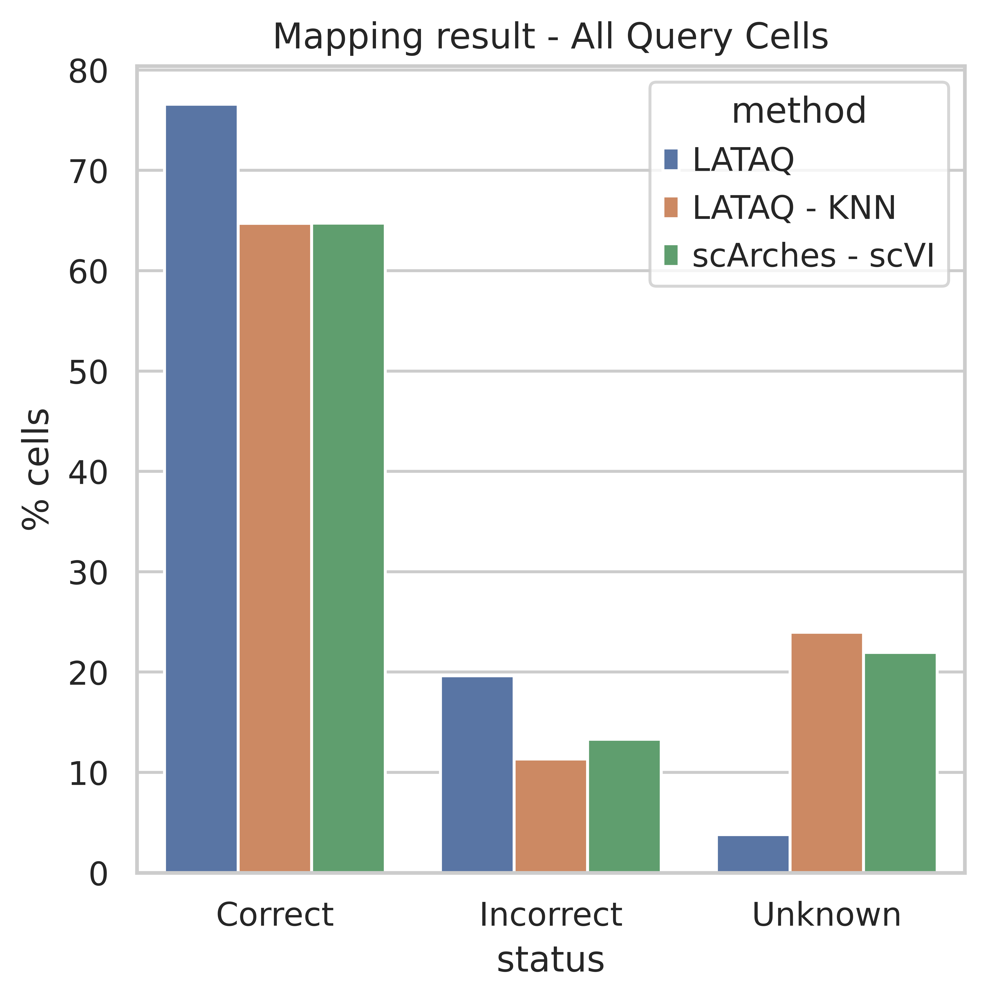

In [34]:
sns.set(rc={'figure.figsize':(5,5)})

with sns.axes_style("whitegrid"):
    summary_df = (
        label_transfer_all.groupby(['method', 'status']).agg({'pred': 'count'})
        / label_transfer_all.groupby(['method']).agg({'pred': 'count'})
        * 100
    ).reset_index()
    sns.barplot(x="status", y="pred", hue="method", data=summary_df)
    plt.ylabel('% cells')
    plt.title('Mapping result - All Query Cells')
    plt.show()

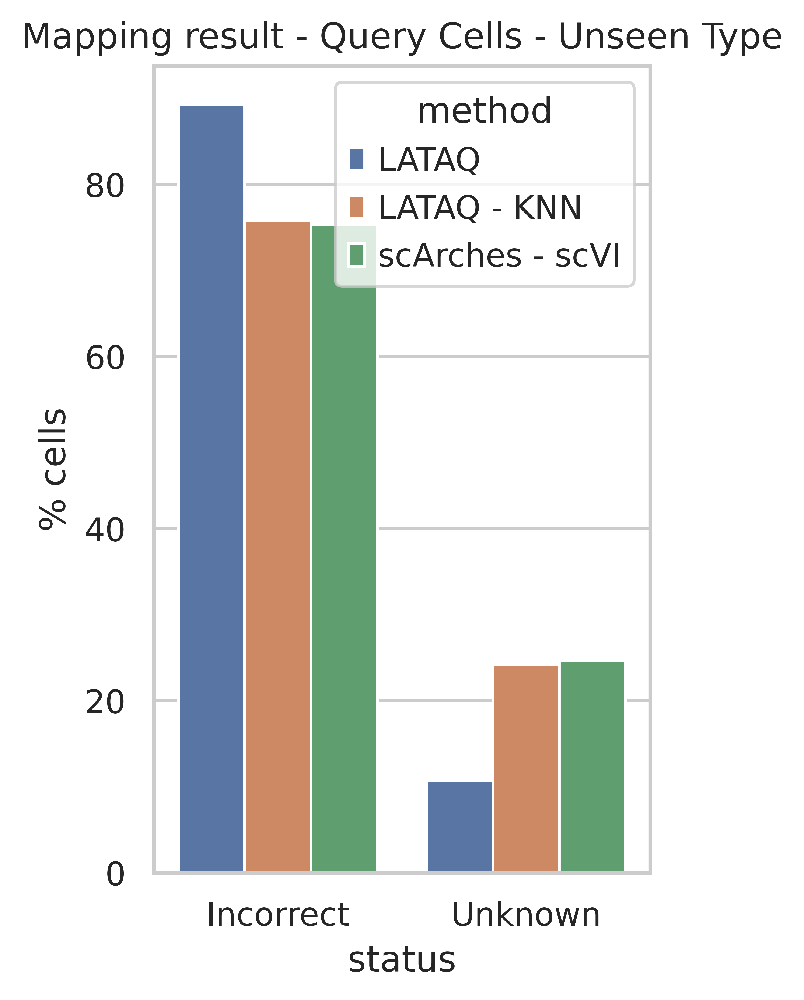

In [35]:
sns.set(rc={'figure.figsize':(3,5)})

with sns.axes_style("whitegrid"):
    df = label_transfer_all[label_transfer_all['manual_ann'].map(lambda x: manual_to_fine_grained[x][0]) == 'New']
    summary_df = (
        df.groupby(['method', 'status']).agg({'pred': 'count'})
        / df.groupby(['method']).agg({'pred': 'count'})
        * 100
    ).reset_index()
    # for method in summary_df['method']:
    #     summary_df = pd.concat([pd.DataFrame([[method, 'Correct', 0]], columns=['method', 'status', 'count']), summary_df])
    sns.barplot(x="status", y="pred", hue="method", data=summary_df)
    plt.ylabel('% cells')
    plt.title('Mapping result - Query Cells - Unseen Type')
    plt.show()

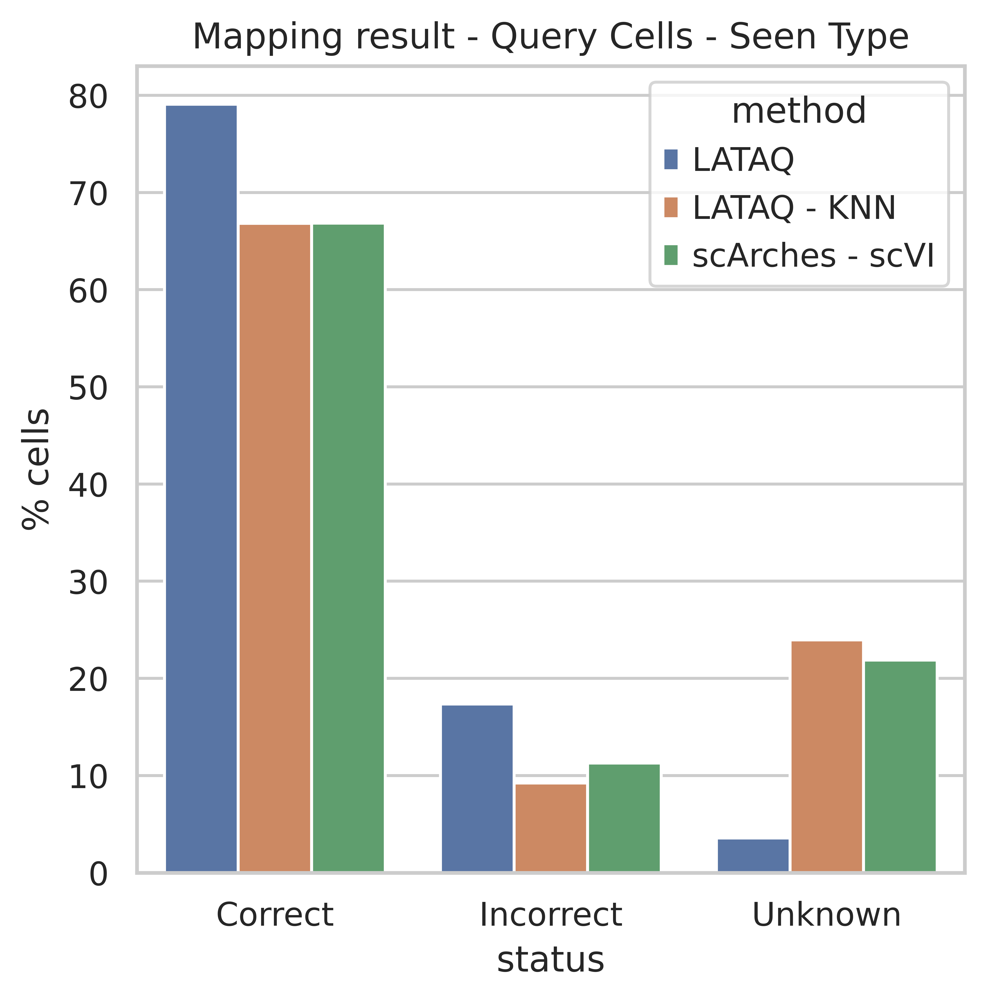

In [36]:
sns.set(rc={'figure.figsize':(5,5)})

with sns.axes_style("whitegrid"):
    df = label_transfer_all[label_transfer_all['manual_ann'].map(lambda x: manual_to_fine_grained[x][0]) != 'New']
    summary_df = (
        df.groupby(['method', 'status']).agg({'pred': 'count'})
        / df.groupby(['method']).agg({'pred': 'count'})
        * 100
    ).reset_index()
    sns.barplot(x="status", y="pred", hue="method", data=summary_df)
    plt.ylabel('% cells')
    plt.title('Mapping result - Query Cells - Seen Type')
    plt.show()

In [ ]:
sns.boxplot(x='status_plus', hue='method', y='prob', data=label_transfer_all)
plt.xticks(rotation=90)
plt.show()

In [ ]:
sns.boxplot(x='uncertainity_target', hue='method', y='prob', data=label_transfer_all)
plt.xticks(rotation=90)
plt.ylim(-0.1,1)
plt.show()

In [39]:
sns.set(rc={'figure.figsize':(14,3)})

for method, df in label_transfer_all.groupby('method'):
    print(method)
    sns.boxplot(x='manual_ann_fig', y='prob', data=df, order=ct_ordered_q)
    plt.xticks(rotation=90)
    plt.ylabel('Uncertainty')
    plt.xlabel('')
    plt.show()
    
#     sns.displot(data=df, x="prob", hue="uncertainity_target", kind="kde")
#     plt.show()

LATAQ


LATAQ - KNN


scArches - scVI


In [40]:
from sklearn.metrics import confusion_matrix

In [ ]:
sns.set(rc={'figure.figsize':(14,14)})

labels = sorted(set(list(df.pred.values) + list(df.manual_ann.values)))

for method, df in label_transfer_all.groupby('method'):
    print(method)
    conf_df = pd.DataFrame(confusion_matrix(df.pred, df.manual_ann, labels=labels, normalize='true'),
                           index=labels,
                           columns=labels)
    sns.heatmap(conf_df)
    plt.show()

In [42]:
label_transfer_all

,original_pred,prob,pred,manual_ann,status,method,manual_ann_fig,status_plus,status_pure,uncertainity_target
0,Interstitial Mφ perivascular,0.235383,Interstitial Mφ perivascular,Interstitial macrophages,Correct,LATAQ,Interstitial macrophages,Correct,Correct,certain
1,Adventitial fibroblasts,0.075392,Adventitial fibroblasts,Fibroblasts,Correct,LATAQ,Fibroblasts,Correct,Correct,certain
2,Lymphatic EC differentiating,0.109095,Lymphatic EC differentiating,Lymphatic EC,Correct,LATAQ,Lymphatic EC,Correct,Correct,certain
3,Adventitial fibroblasts,0.075410,Adventitial fibroblasts,Fibroblasts,Correct,LATAQ,Fibroblasts,Correct,Correct,certain
4,Adventitial fibroblasts,0.069759,Adventitial fibroblasts,Fibroblasts,Correct,LATAQ,Fibroblasts,Correct,Correct,certain
...,...,...,...,...,...,...,...,...,...,...
385879,CD4 T cells,0.379994,Unknown,CD4 T cells,Unknown,scArches - scVI,CD4 T cells,True Prediction Unknown,Correct,certain
385880,Mast cells,0.000000,Mast cells,Mast cells,Correct,scArches - scVI,Mast cells,Correct,Correct,certain
385881,NK cells,0.000000,NK cells,NK cells,Correct,scArches - scVI,NK cells,Correct,Correct,certain
385882,CD8 T cells,0.019998,CD8 T cells,Gamma-delta T cells,Incorrect,scArches - scVI,Gamma-delta T cells,Incorrect,Incorrect,uncertain


In [44]:
result_df = []
for method, df in label_transfer_all.groupby('method'):
    print(method)
    seen_df = df[df['manual_ann'].map(lambda x: manual_to_fine_grained[x][0]) != 'New'].copy()
    unseen_df = df[df['manual_ann'].map(lambda x: manual_to_fine_grained[x][0]) == 'New'].copy()
    for threshold in np.arange(0, 2, 0.01):
        tp = len(seen_df[(seen_df['status_pure'] == 'Correct') & (seen_df['prob'] < threshold)]) / len(seen_df)
        fu = len(unseen_df[unseen_df['prob'] < threshold]) / len(unseen_df)
        result_df.append((threshold, tp, fu, method))
result_df = pd.DataFrame(result_df, columns=['threshold', 'Seen Cell True Prediction', 'Unseen Cell Assignment', 'Method'])
# result_df.plot(x='TP', y='TU', drawstyle="steps")
# plt.show()

LATAQ
LATAQ - KNN
scArches - scVI


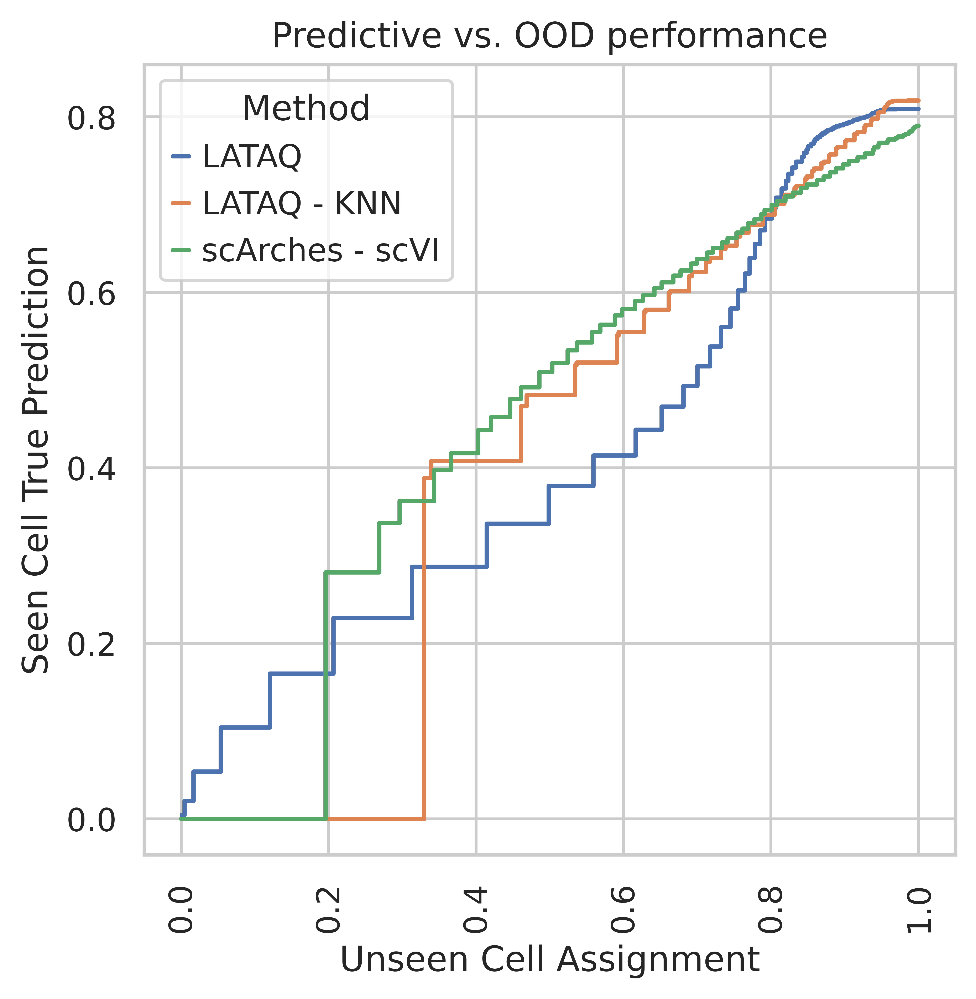

In [ ]:
X = result_df
sns.set(rc={'figure.figsize':(5,5)})
with sns.axes_style("whitegrid"):

    sns.lineplot(x='Unseen Cell Assignment', y='Seen Cell True Prediction', 
                 hue='Method', data=X, drawstyle='steps-post')
    plt.title('Predictive vs. OOD performance')
    plt.xticks(rotation=90)
    plt.show()

    X = result_df[result_df['Seen Cell True Prediction'] > 0.60]
    sns.lineplot(x='Unseen Cell Assignment', y='Seen Cell True Prediction', 
                 hue='Method', data=X, drawstyle='steps-post')
    plt.xticks(rotation=90)
    plt.show()

In [ ]:
lataq_results_df

In [ ]:
filename_ref = os.path.expanduser(f"~/tmp/ref_predictions_2/{study}")
with open(filename_ref, 'rb') as f:
    reference_predictions, latent_reference_adata = pickle.load(f)

filename = os.path.expanduser(f"~/tmp/subdata_predictions_2/{study}")
with open(filename, 'rb') as f:
    subdata_predictions, latent_subadata = pickle.load(f)

In [ ]:
latent_reference_adata.obs['predictions'] = reference_predictions['ann_finest_level']['preds']
latent_reference_adata.obs['uncertainty'] = reference_predictions['ann_finest_level']['probs']
latent_reference_adata.obs['dataset'] = 'Reference'
latent_reference_adata.obs['cell type'] = latent_reference_adata.obs['ann_finest_level'].map(ann_finest_to_fig_mapping)
latent_subadata.obs['lataq_predictions'] = lataq_results_df['original_pred'].values
latent_subadata.obs['lataq_uncertainty'] = lataq_results_df['prob'].values
latent_subadata.obs['lataq_pred_status'] = lataq_results_df['status'].values
latent_subadata.obs['lataq_knn_predictions'] = lataq_knn_results_df['original_pred'].values
latent_subadata.obs['lataq_knn_uncertainty'] = lataq_knn_results_df['prob'].values
latent_subadata.obs['lataq_knn_pred_status'] = lataq_knn_results_df['status'].values
latent_subadata.obs['scarches_predictions'] = scarches_results_df['original_pred'].values
latent_subadata.obs['scarches_uncertainty'] = scarches_results_df['prob'].values
latent_subadata.obs['scarches_pred_status'] = scarches_results_df['status'].values
latent_subadata.obs['dataset'] = 'Query'
latent_subadata.obs['manual_ann'] = (
    latent_subadata.obs['original_celltype_ann']
    .map(dict(zip(mapping_df['Meyer_2021'].values, mapping_df['ann_finest_level'].values)))
)
latent_subadata.obs['cell type'] = latent_subadata.obs['manual_ann'].map(manual_to_fig_label)

In [ ]:
# sub_adata = anndata.concat([
#     sc.pp.subsample(latent_reference_adata, n_obs=20000, copy=True), 
#     sc.pp.subsample(latent_subadata, n_obs=20000, copy=True), 
#     ], join='outer').copy()
sub_adata = anndata.concat([
    latent_reference_adata, 
    latent_subadata,
    ], join='outer')
sub_adata

In [ ]:
sc.pp.neighbors(sub_adata)
sc.tl.umap(sub_adata)

In [ ]:
sub_adata.obs.drop(columns=['ann_new'], inplace=True)

In [ ]:
sub_adata.write('/lustre/home/icb/amirali.moinfar/tmp/scarchers_uncertainity_all_data.h5ad')

In [ ]:
sub_adata = sc.read_h5ad('/lustre/home/icb/amirali.moinfar/tmp/scarchers_uncertainity_all_data.h5ad')

In [ ]:
sub_adata

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1)
sub_adata.obs['Source'] = np.where(
    sub_adata.obs['dataset'] == 'Reference',
    'Reference',
    np.where(
        sub_adata.obs['manual_ann'].map(lambda x: manual_to_fine_grained[x][0] if x in manual_to_fine_grained else 'X') == 'New',
        'Query - Unseen',
        'Query - Seen',
    )
    
)
ax.set_facecolor('white')

sc.pl.umap(sub_adata[sub_adata.obs['Source'] == 'Reference'], color='Source', ax=ax,
           alpha=1, size=2, show=False, palette={'Reference': 'lightgrey'},)
sc.pl.umap(sub_adata[sub_adata.obs['Source'] == 'Query - Seen'], color='Source', ax=ax, 
           alpha=1, size=1, show=False, palette={'Query - Seen': 'darkgreen', 'Query - Unseen': 'darkred'},)
sc.pl.umap(sub_adata[sub_adata.obs['Source'] == 'Query - Unseen'], color='Source', ax=ax, 
           alpha=1, size=1, show=False, palette={'Query - Seen': 'darkgreen', 'Query - Unseen': 'darkred'},)
plt.show()

In [ ]:
color_palette = dict(zip(sorted(sub_adata.obs['cell type'].unique()), sc.plotting.palettes.godsnot_102))

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.set_facecolor('white')

sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Reference'], color='dataset', ax=ax,
           alpha=1, size=0, show=False, palette={'Reference': 'lightgrey'})
sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Reference'], color='cell type', ax=ax,
           alpha=0.5, size=1, show=False, palette=color_palette)

plt.title('Reference Cells')
plt.show()

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.set_facecolor('white')

sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Reference'], color='dataset', ax=ax,
           alpha=1, size=2, show=False, palette={'Reference': 'lightgrey'})
sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Query'], color='cell type', ax=ax, 
           alpha=1, size=1, show=False, palette=color_palette)
plt.title('Query Cells')
plt.show()

In [ ]:
for method, title in [('lataq', 'Uncertainty of cells in LATAQ'), 
                      ('lataq_knn', 'Uncertainty of cells in LATAQ - KNN'), 
                      ('scarches', 'Uncertainty of cells in scArches - scVI')]:
    fig, ax = plt.subplots(nrows=1, ncols=1)
    ax.set_facecolor('white')

    sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Reference'], color='dataset', ax=ax,
               alpha=1, size=2, show=False, palette={'Reference': 'lightgrey'})
    sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Query'], color=f'{method}_pred_status', ax=ax, 
               alpha=1, size=1, show=False,)
    plt.title(title)
    plt.show()

In [ ]:
for method, title in [('lataq', 'Uncertainty of cells in LATAQ'), 
                      ('lataq_knn', 'Uncertainty of cells in LATAQ - KNN'), 
                      ('scarches', 'Uncertainty of cells in scArches - scVI')]:
    fig, ax = plt.subplots(nrows=1, ncols=1)
    ax.set_facecolor('white')


    sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Reference'], color='dataset', ax=ax,
               alpha=1, size=2, show=False, palette={'Reference': 'lightgrey'})
    ax.get_legend().remove()

    sc.pl.umap(sub_adata[sub_adata.obs['dataset'] == 'Query'], color=f'{method}_uncertainty', ax=ax, 
               alpha=1, size=1, show=False,)
    plt.title(title)
    plt.show()